<a href="https://colab.research.google.com/github/rhandypiedadmartinez/RadRemote/blob/master/Martinez_Bernabe_Decision_Tree_on_Chronic_Kidney_Disease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [97]:
!pip install scikit-learn

In [98]:
!wget https://archive.ics.uci.edu/static/public/336/chronic+kidney+disease.zip

--2023-12-06 15:12:00--  https://archive.ics.uci.edu/static/public/336/chronic+kidney+disease.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘chronic+kidney+disease.zip.1’

chronic+kidney+dise     [ <=>                ]  18.96K  --.-KB/s    in 0.06s   

2023-12-06 15:12:00 (312 KB/s) - ‘chronic+kidney+disease.zip.1’ saved [19410]



In [99]:
!unzip -o chronic+kidney+disease.zip
!ls

Archive:  chronic+kidney+disease.zip
 extracting: Chronic_Kidney_Disease.rar  
Chronic_Kidney_Disease		  chronic+kidney+disease.zip	sample_data
chronic_kidney_disease_full.arff  chronic+kidney+disease.zip.1
Chronic_Kidney_Disease.rar	  clean.csv


In [100]:
!unrar x C*.rar
!ls


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from Chronic_Kidney_Disease.rar


Would you like to replace the existing file Chronic_Kidney_Disease/chronic_kidney_disease.arff
 44268 bytes, modified on 2015-07-04 14:48
with a new one
 44268 bytes, modified on 2015-07-04 14:48

[Y]es, [N]o, [A]ll, n[E]ver, [R]ename, [Q]uit 
User break

User break
Chronic_Kidney_Disease		  chronic+kidney+disease.zip	sample_data
chronic_kidney_disease_full.arff  chronic+kidney+disease.zip.1
Chronic_Kidney_Disease.rar	  clean.csv


In [ ]:
!mv Chronic_Kidney_Disease/chronic_kidney_disease_full.arff .
!ls

Chronic_Kidney_Disease		  Chronic_Kidney_Disease.rar  sample_data
chronic_kidney_disease_full.arff  chronic+kidney+disease.zip


In [101]:
file_path="/content/chronic_kidney_disease_full.arff"

In [ ]:
!pip install AutoViz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 940.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 30.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 397.5/397.5 kB 30.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 65.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.3/87.3 kB 9.0 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of panel to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.4/20.4 MB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.4/20.4 MB 43.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/2

In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import tree
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,accuracy_score,recall_score,f1_score,matthews_corrcoef
import seaborn as sns
import matplotlib.pyplot as plt

In [209]:
import pandas as pd
import regex as re

data = []

with open('chronic_kidney_disease_full.arff', "r") as f:
    for line in f:
        if line[-1] == " ":
          print(line)
        line = re.sub(r',*$', '', line)                           #excess ending delimiter in line 215, 218
        line = line.strip().replace(',,', ',')                            # line 515
        line = ",".join([value.strip() for value in line.split(',')])

        line = line.replace("?","NaN")                                    # many null values

        line = re.sub(r'\byes\b', '1', line)                           # change binominal to bool
        line = re.sub(r'\bno\b', '0', line)

        line = re.sub(r'\bnormal\b', '1', line)
        line = re.sub(r'\babnormal\b', '0', line)

        line = re.sub(r'\bpresent\b', '1', line)
        line = re.sub(r'\bnotpresent\b', '0', line)

        line = re.sub(r'\bgood\b', '1', line)
        line = re.sub(r'\bpoor\b', '0', line)

        line = re.sub(r'\bnotckd\b', '1', line)
        line = re.sub(r'\bckd\b', '0', line)

        data.append(line.split(','))                                        # split line into arrays with delimiter comma

for i in data:
  if (len(i)==26):
      print(i)

In [210]:
features = ['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba',
            'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wbcc',
            'rbcc', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane', 'class']

data_types = {'age':'Int64',
              'bp':'Int64',
              'sg':'float64',
              'al':'Int64',
              'su':'Int64',
              'rbc':'bool',
              'pc':'bool',
              'pcc':'bool',
              'ba':'bool',
              'bgr':'Int64',
              'bu':'float64',
              'sc':'float64',
              'sod':'float64',
              'pot':'float64',
              'hemo':'float64',
              'pcv':'Int64',
              'wbcc':'Int64',
              'rbcc':'float64',
              'htn':'bool',
              'dm':'bool',
              'cad':'bool',
              'appet':'bool',
              'pe':'bool',
              'ane':'bool',
              'class':'bool'}


# Create a DataFrame
df = pd.DataFrame(data[146:-2], columns=features)

df["class"].value_counts()

0    249
1    150
Name: class, dtype: int64

In [211]:
# Set Data Types
df = df.replace("NaN", np.nan)
df["class"].value_counts()

0    249
1    150
Name: class, dtype: int64

In [212]:
# data (as pandas dataframes)
X = df.drop("class", axis=1)
y = df["class"]

In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   age     390 non-null    object
 1   bp      387 non-null    object
 2   sg      352 non-null    object
 3   al      353 non-null    object
 4   su      350 non-null    object
 5   rbc     248 non-null    object
 6   pc      334 non-null    object
 7   pcc     395 non-null    object
 8   ba      395 non-null    object
 9   bgr     355 non-null    object
 10  bu      380 non-null    object
 11  sc      382 non-null    object
 12  sod     313 non-null    object
 13  pot     312 non-null    object
 14  hemo    347 non-null    object
 15  pcv     328 non-null    object
 16  wbcc    293 non-null    object
 17  rbcc    268 non-null    object
 18  htn     397 non-null    object
 19  dm      397 non-null    object
 20  cad     397 non-null    object
 21  appet   398 non-null    object
 22  pe      398 non-null    ob

In [109]:
df.describe()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wbcc,rbcc,htn,dm,cad,appet,pe,ane,class
count,390,387,352,353,350,248,334,395,395,355,380,382,313,312,347,328,293,268,397,397,397,398,398,398,399
unique,76,10,5,6,6,2,2,2,2,146,118,86,34,42,118,42,89,48,2,2,2,2,2,2,2
top,60,80,1.020,0,0,1,1,0,0,99,46,1.2,135,3.5,15.0,52,9800,5.2,0,0,0,1,0,0,0
freq,19,115,105,199,289,201,258,353,373,10,15,39,40,30,12,21,11,17,251,261,363,316,322,338,249


In [110]:
df.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wbcc,rbcc,htn,dm,cad,appet,pe,ane,class
0,7,50,1.020,4,0,NaN,1,0,0,NaN,18,0.8,NaN,NaN,11.3,38,6000,NaN,0,0,0,1,0,0,0
1,62,80,1.010,2,3,1,1,0,0,423,53,1.8,NaN,NaN,9.6,31,7500,NaN,0,1,0,0,0,1,0
2,48,70,1.005,4,0,1,0,1,0,117,56,3.8,111,2.5,11.2,32,6700,3.9,1,0,0,0,1,1,0
3,51,80,1.010,2,0,1,1,0,0,106,26,1.4,NaN,NaN,11.6,35,7300,4.6,0,0,0,1,0,0,0
4,60,90,1.015,3,0,NaN,NaN,0,0,74,25,1.1,142,3.2,12.2,39,7800,4.4,1,1,0,1,1,0,0


# INITIAL EXPLORATORY DATA ANALYSIS

Shape of your Data Set loaded: (399, 25)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    24 Predictors classified...
        10 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane']

################ Binary_Classification problem #####################
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,float64,2.255639,NA,2.000000,90.000000,"9 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 7 outliers greater than upper bound (98.88) or lower than lower bound(7.88). Cap them or remove them."
bp,float64,3.007519,NA,50.000000,180.000000,"12 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 36 outliers greater than upper bound (95.00) or lower than lower bound(55.00). Cap them or remove them."
sg,float64,11.779449,NA,1.005000,1.025000,"47 missing values. Impute them with mean, median, mode, or a constant value such as 123."
al,float64,11.528822,NA,0.000000,5.000000,"46 missing values. Impute them with mean, median, mode, or a constant value such as 123."
su,float64,12.280702,NA,0.000000,5.000000,"49 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 61 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them."
bgr,float64,11.027569,NA,22.000000,490.000000,"44 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 34 outliers greater than upper bound (259.00) or lower than lower bound(3.00). Cap them or remove them."
bu,float64,4.761905,NA,1.500000,391.000000,"19 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 38 outliers greater than upper bound (124.50) or lower than lower bound(-31.50). Cap them or remove them."
sc,float64,4.260652,NA,0.400000,76.000000,"17 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 51 outliers greater than upper bound (5.65) or lower than lower bound(-1.95). Cap them or remove them."
sod,float64,21.553885,NA,4.500000,163.000000,"86 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 16 outliers greater than upper bound (152.50) or lower than lower bound(124.50). Cap them or remove them."
pot,float64,21.804511,NA,2.500000,47.000000,"87 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 4 outliers greater than upper bound (6.55) or lower than lower bound(2.15). Cap them or remove them."


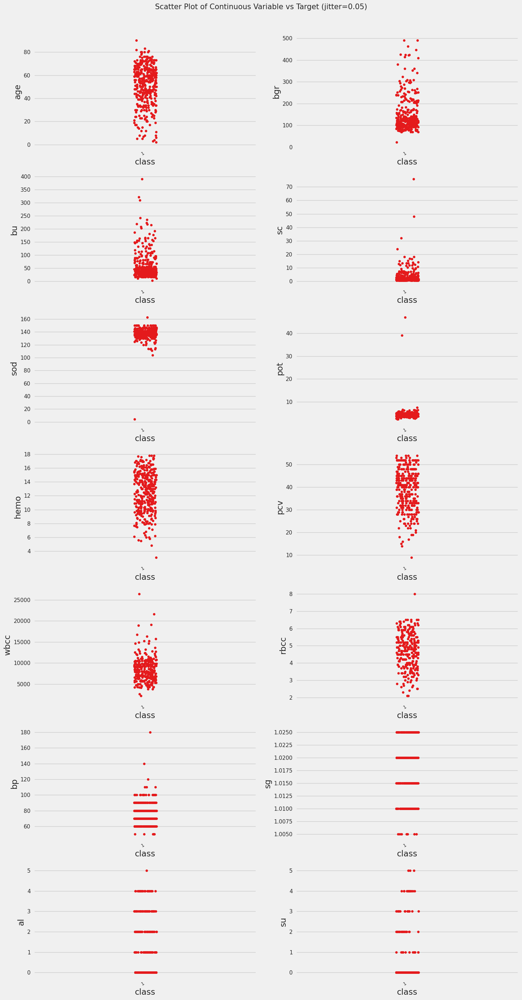

Total Number of Scatter Plots = 105


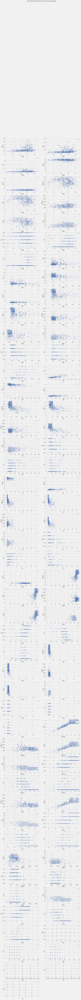

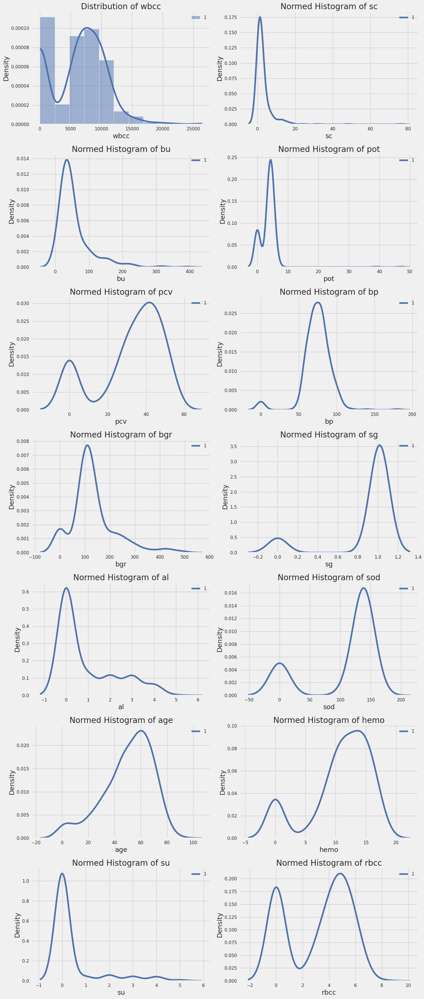

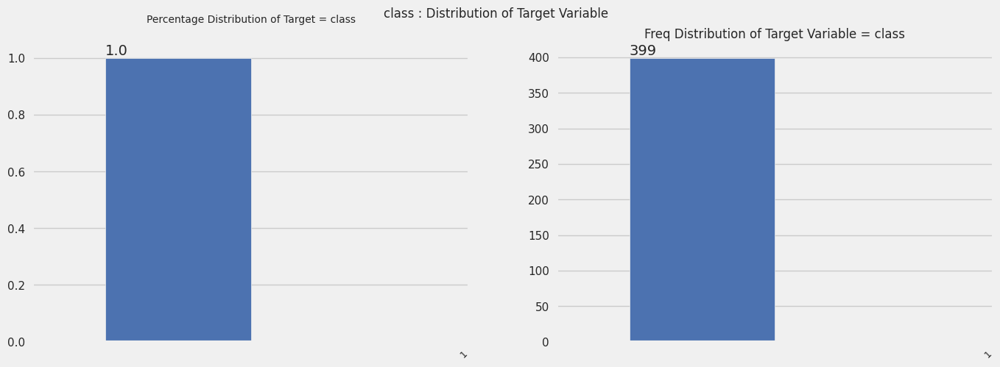

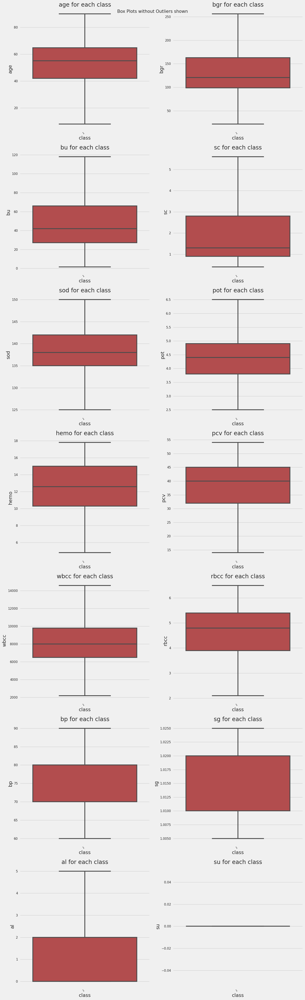

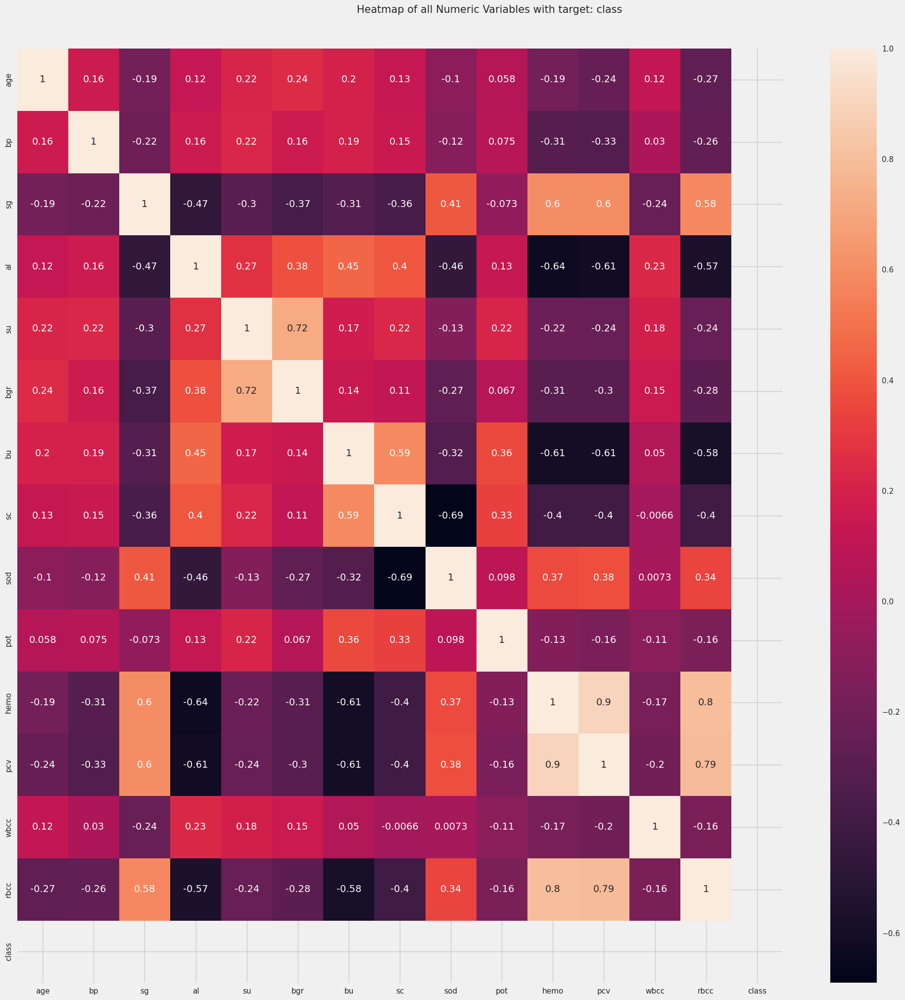

All Plots done
Time to run AutoViz = 53 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
%matplotlib inline
import pandas as pd
from autoviz import AutoViz_Class

df = pd.read_csv('clean.csv')

AV = AutoViz_Class()

dft = AV.AutoViz(
    filename="",
    sep="",
    depVar="class",
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="png",
    max_rows_analyzed=400,
    max_cols_analyzed=25,
)


# DATA IMPUTATION TO FILL UP NULL VALUES BY MODE (nominal data) AND MEAN (numeric data)

In [214]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer

X = df.drop("class", axis=1).astype(float)
y = df["class"].astype(float)

# Numeric Columns are the List below
numeric_columns = ['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wbcc', 'rbcc']
boolean_columns = list(X.columns.drop(numeric_columns))

print(numeric_columns)
print(boolean_columns)

x1 = X[numeric_columns] = X[numeric_columns].astype("float64")
x2 = X[boolean_columns] = X[boolean_columns].astype(object)

# Create imputers for numeric and boolean columns
imputer_float = SimpleImputer(strategy='mean')
imputer_obj = SimpleImputer(strategy='most_frequent')

# Fit and transform imputers
df_imputed_1 = pd.DataFrame(imputer_float.fit_transform(x1), columns=x1.columns)
df_imputed_2 = pd.DataFrame(imputer_obj.fit_transform(x2), columns=x2.columns)

# X_imputed_df[numeric_columns] = X[numeric_columns].astype("float64")
# X_imputed_df[boolean_columns] = X[boolean_columns].astype("Int64")

# Describe the DataFrame
print(df_imputed_1.describe())
print(df_imputed_1.info())
print(df_imputed_2.describe())
print(df_imputed_2.info())


['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wbcc', 'rbcc']
['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane']
           age         bp          sg          al          su          bgr     \
count  399.000000  399.000000  399.000000  399.000000  399.000000  399.000000   
mean    51.492308   76.459948    1.017401    1.016997    0.451429  148.112676   
std     16.995379   13.492053    0.005375    1.273915    1.030532   74.864224   
min      2.000000   50.000000    1.005000    0.000000    0.000000   22.000000   
25%     42.000000   70.000000    1.015000    0.000000    0.000000  101.000000   
50%     54.000000   76.459948    1.017401    1.000000    0.000000  127.000000   
75%     64.000000   80.000000    1.020000    2.000000    0.451429  150.000000   
max     90.000000  180.000000    1.025000    5.000000    5.000000  490.000000   

           bu          sc          sod         pot        hemo         pcv     \
count  399.000000  399.0

In [215]:
X_concat = pd.concat([df_imputed_1,df_imputed_2], axis="columns")
df2 = pd.concat([X_concat, y], axis="columns")

df2[numeric_columns] = df2[numeric_columns].astype("float64")
df2[boolean_columns] = df2[boolean_columns].astype(int)

print(df2["class"].value_counts())

0.0    249
1.0    150
Name: class, dtype: int64


In [217]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     399 non-null    float64
 1   bp      399 non-null    float64
 2   sg      399 non-null    float64
 3   al      399 non-null    float64
 4   su      399 non-null    float64
 5   bgr     399 non-null    float64
 6   bu      399 non-null    float64
 7   sc      399 non-null    float64
 8   sod     399 non-null    float64
 9   pot     399 non-null    float64
 10  hemo    399 non-null    float64
 11  pcv     399 non-null    float64
 12  wbcc    399 non-null    float64
 13  rbcc    399 non-null    float64
 14  rbc     399 non-null    int64  
 15  pc      399 non-null    int64  
 16  pcc     399 non-null    int64  
 17  ba      399 non-null    int64  
 18  htn     399 non-null    int64  
 19  dm      399 non-null    int64  
 20  cad     399 non-null    int64  
 21  appet   399 non-null    int64  
 22  pe

#Exploratory Data Analysis

Shape of your Data Set loaded: (399, 25)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    24 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,float64,0.000000,NA,2.000000,90.000000,has 10 outliers greater than upper bound (97.00) or lower than lower bound(9.00). Cap them or remove them.
bp,float64,0.000000,NA,50.000000,180.000000,has 36 outliers greater than upper bound (95.00) or lower than lower bound(55.00). Cap them or remove them.
sg,float64,0.000000,NA,1.005000,1.025000,has 7 outliers greater than upper bound (1.03) or lower than lower bound(1.01). Cap them or remove them.
al,float64,0.000000,NA,0.000000,5.000000,No issue
su,float64,0.000000,NA,0.000000,5.000000,has 48 outliers greater than upper bound (1.13) or lower than lower bound(-0.68). Cap them or remove them.
bgr,float64,0.000000,NA,22.000000,490.000000,has 53 outliers greater than upper bound (223.50) or lower than lower bound(27.50). Cap them or remove them.
bu,float64,0.000000,NA,1.500000,391.000000,has 39 outliers greater than upper bound (115.75) or lower than lower bound(-26.25). Cap them or remove them.
sc,float64,0.000000,NA,0.400000,76.000000,has 44 outliers greater than upper bound (6.34) or lower than lower bound(-2.37). Cap them or remove them.
sod,float64,0.000000,NA,4.500000,163.000000,has 18 outliers greater than upper bound (150.00) or lower than lower bound(126.00). Cap them or remove them.
pot,float64,0.000000,NA,2.500000,47.000000,has 14 outliers greater than upper bound (6.00) or lower than lower bound(2.80). Cap them or remove them.


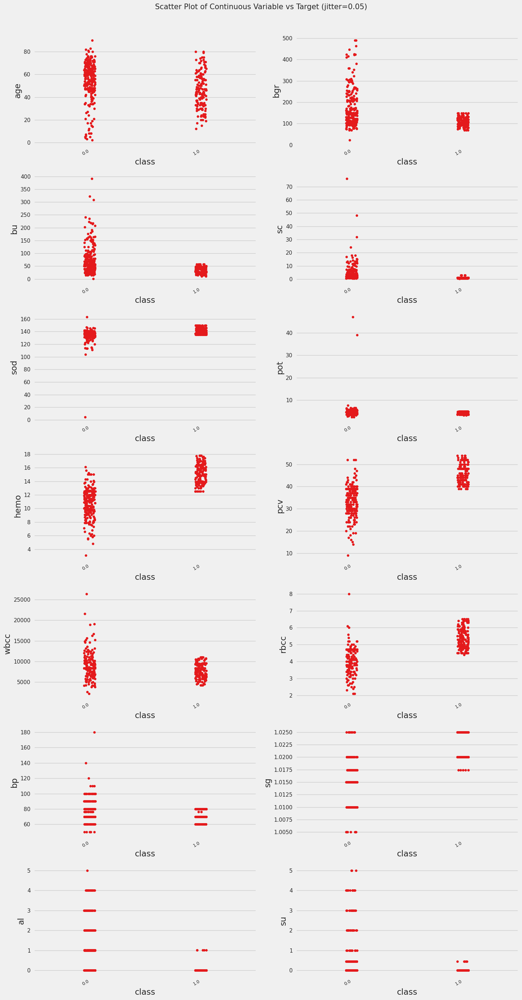

Total Number of Scatter Plots = 105


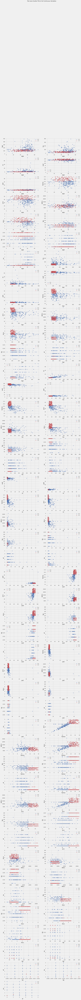

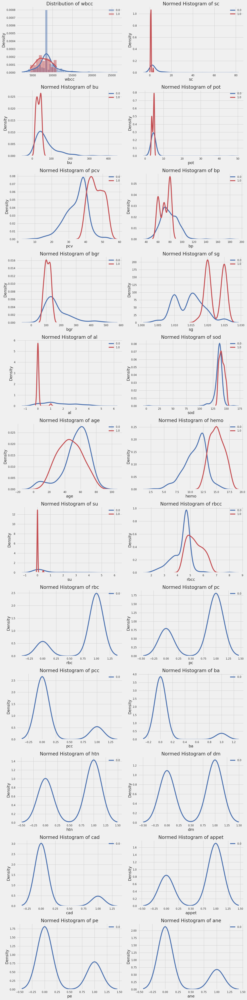

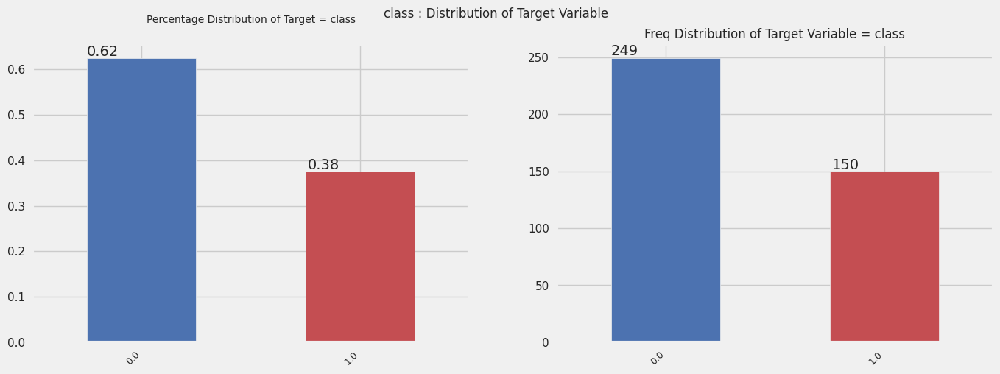

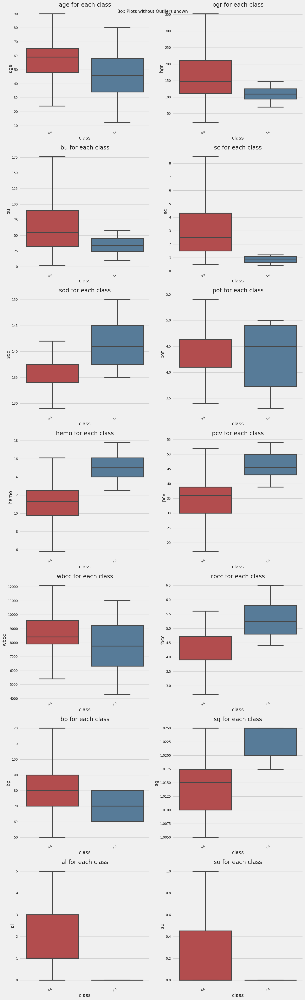

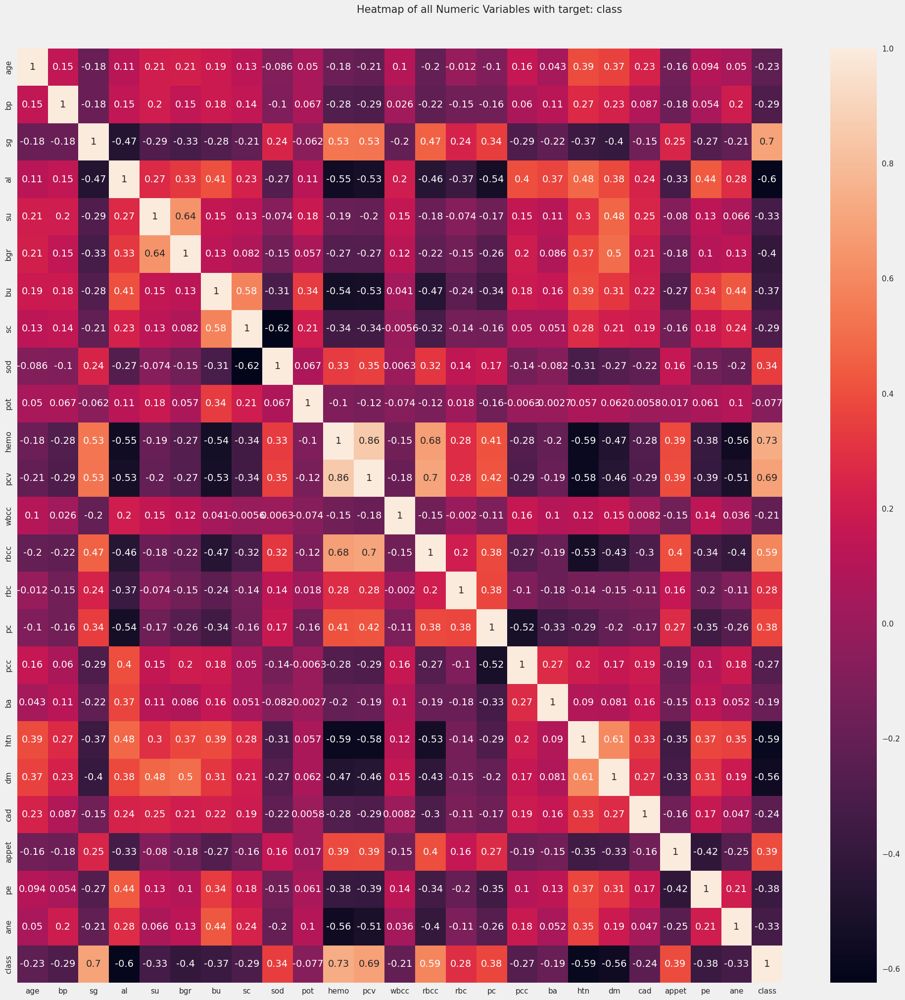

All Plots done
Time to run AutoViz = 94 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [218]:
%matplotlib inline
import pandas as pd
from autoviz import AutoViz_Class

AV = AutoViz_Class()

dft = AV.AutoViz(
    filename="",
    sep="",
    depVar="class",
    dfte=df2,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="png",
    max_rows_analyzed=400,
    max_cols_analyzed=25,
)

In [219]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     399 non-null    float64
 1   bp      399 non-null    float64
 2   sg      399 non-null    float64
 3   al      399 non-null    float64
 4   su      399 non-null    float64
 5   bgr     399 non-null    float64
 6   bu      399 non-null    float64
 7   sc      399 non-null    float64
 8   sod     399 non-null    float64
 9   pot     399 non-null    float64
 10  hemo    399 non-null    float64
 11  pcv     399 non-null    float64
 12  wbcc    399 non-null    float64
 13  rbcc    399 non-null    float64
 14  rbc     399 non-null    int64  
 15  pc      399 non-null    int64  
 16  pcc     399 non-null    int64  
 17  ba      399 non-null    int64  
 18  htn     399 non-null    int64  
 19  dm      399 non-null    int64  
 20  cad     399 non-null    int64  
 21  appet   399 non-null    int64  
 22  pe

#CAPPING OUTLIERS

In [220]:
df3 = df2
df3["class"].value_counts()

0.0    249
1.0    150
Name: class, dtype: int64

In [221]:
binary_features = ['ane', 'appet', 'ba', 'cad', 'dm', 'htn', 'pc', 'pcc', 'pe', 'rbc','class']
numeric_features = df.columns.drop(binary_features)
print(numeric_features)
for col in numeric_features:
  percentiles = df3[col].quantile([0.5, 0.75]).values
  df3[col] = np.clip(df3[col], percentiles[0], percentiles[1])

Index(['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo',
       'pcv', 'wbcc', 'rbcc'],
      dtype='object')


In [222]:
df3["class"].value_counts()

0.0    249
1.0    150
Name: class, dtype: int64

In [223]:
df3.describe()

,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo,pcv,wbcc,rbcc,rbc,pc,pcc,ba,htn,dm,cad,appet,pe,ane,class
count,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000
mean,57.774436,78.225538,1.018612,1.280155,0.124454,136.222952,50.496892,2.002061,138.715535,4.677538,13.252913,40.726351,8701.512313,4.822988,0.882206,0.809524,0.105263,0.055138,0.365915,0.340852,0.085213,0.794486,0.190476,0.150376,0.375940
std,4.398978,1.772243,0.001298,0.447486,0.201979,10.547537,7.948982,0.734405,1.528543,0.076576,0.916910,2.281431,439.320764,0.172573,0.322769,0.393170,0.307278,0.228536,0.482290,0.474591,0.279549,0.404584,0.393170,0.357888,0.484973
min,54.000000,76.459948,1.017401,1.000000,0.000000,127.000000,44.000000,1.400000,137.528754,4.627244,12.518156,38.868902,8408.191126,4.705597,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,54.000000,76.459948,1.017401,1.000000,0.000000,127.000000,44.000000,1.400000,137.528754,4.627244,12.518156,38.868902,8408.191126,4.705597,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,54.000000,76.459948,1.017401,1.000000,0.000000,127.000000,44.000000,1.400000,137.528754,4.627244,12.518156,38.868902,8408.191126,4.705597,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,64.000000,80.000000,1.020000,2.000000,0.451429,150.000000,61.750000,3.077356,141.000000,4.800000,14.600000,44.000000,9400.000000,5.100000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000
max,64.000000,80.000000,1.020000,2.000000,0.451429,150.000000,62.500000,3.077356,141.000000,4.800000,14.600000,44.000000,9400.000000,5.100000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#EDA THE CLIPPED DATAFRAME

Shape of your Data Set loaded: (399, 25)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    24 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 11 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,float64,0.000000,NA,54.000000,64.000000,No issue
bp,float64,0.000000,NA,76.459948,80.000000,No issue
sg,float64,0.000000,NA,1.017401,1.020000,No issue
al,float64,0.000000,NA,1.000000,2.000000,No issue
su,float64,0.000000,NA,0.000000,0.451429,No issue
bgr,float64,0.000000,NA,127.000000,150.000000,No issue
bu,float64,0.000000,NA,44.000000,62.500000,No issue
sc,float64,0.000000,NA,1.400000,3.077356,has a high correlation with ['bu']. Consider dropping one of them.
sod,float64,0.000000,NA,137.528754,141.000000,No issue
pot,float64,0.000000,NA,4.627244,4.800000,No issue


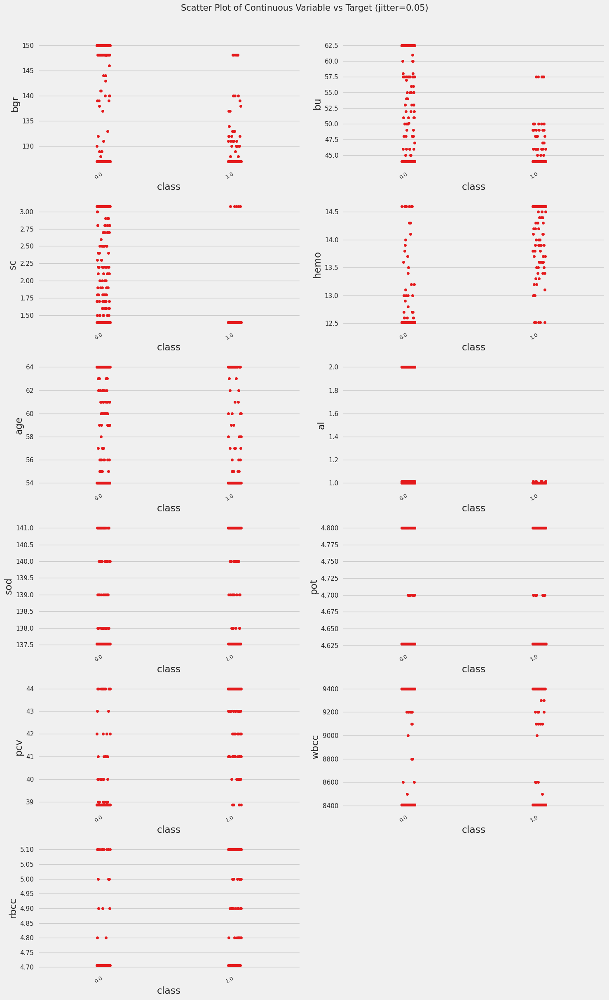

Total Number of Scatter Plots = 66


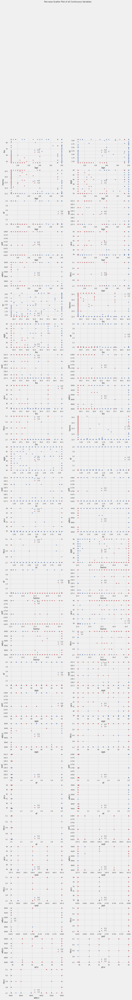

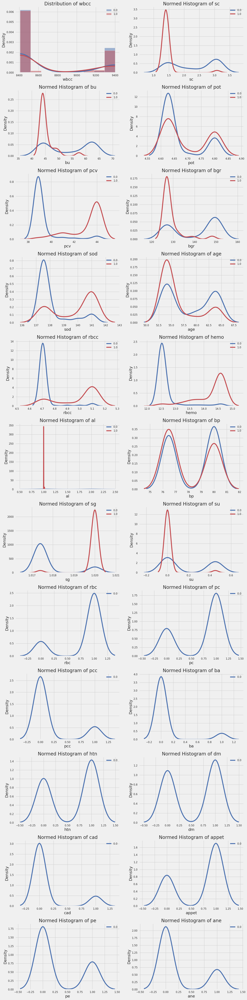

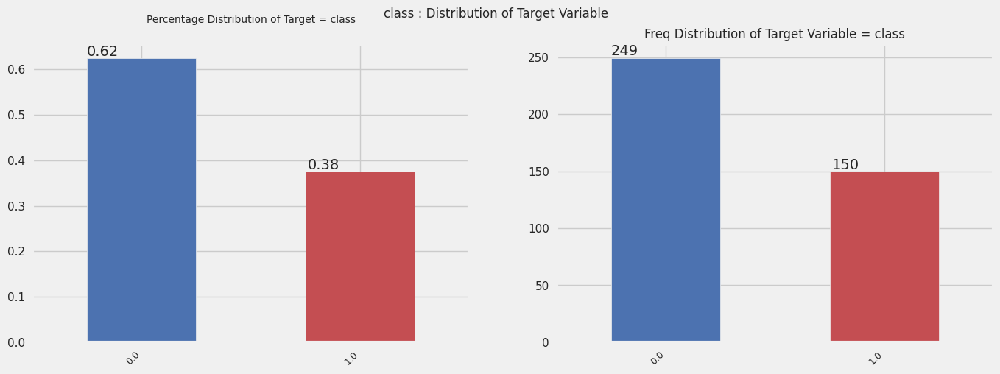

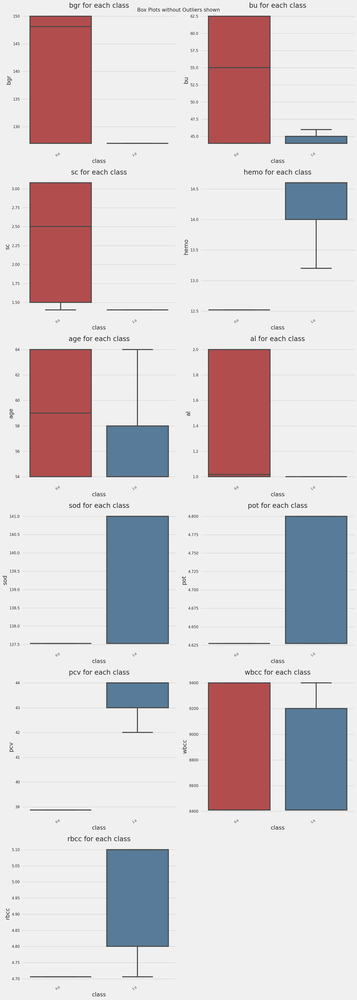

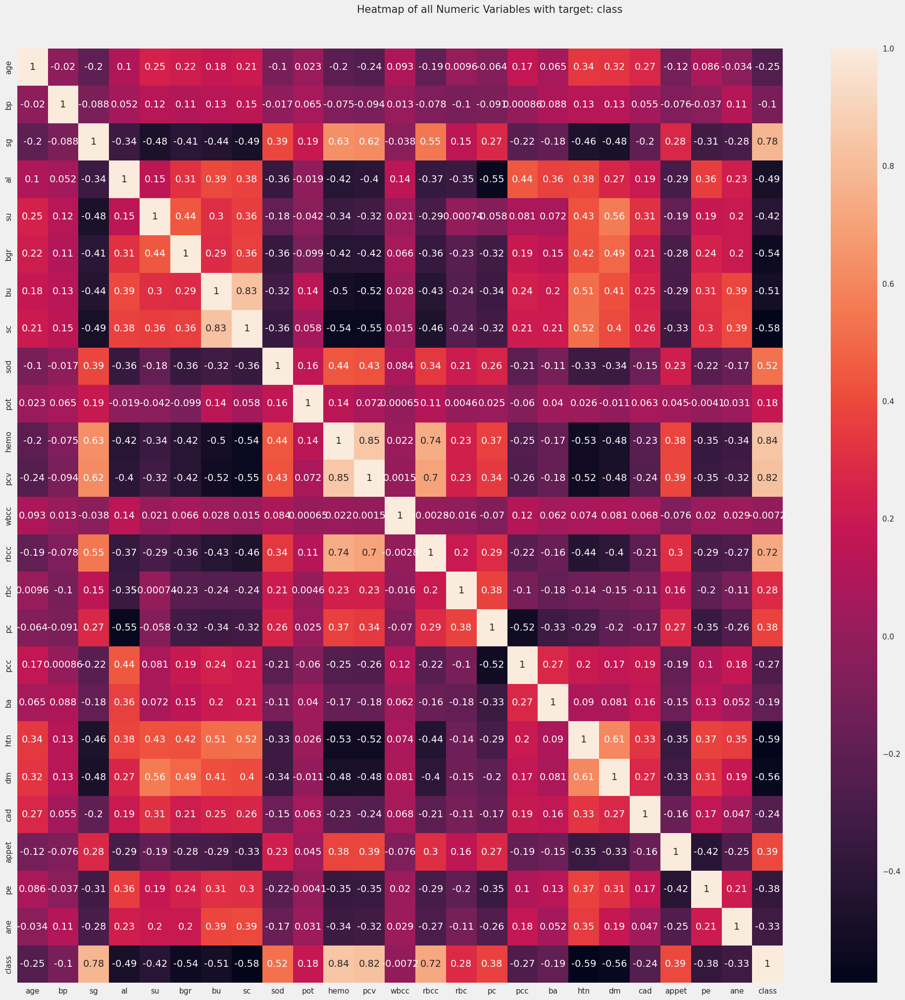

All Plots done
Time to run AutoViz = 78 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [224]:
%matplotlib inline
import pandas as pd
from autoviz import AutoViz_Class

AV = AutoViz_Class()

dft = AV.AutoViz(
    filename="",
    sep="",
    depVar="class",
    dfte=df3,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="png",
    max_rows_analyzed=400,
    max_cols_analyzed=25,
)

In [225]:
# helper function
def plot_confusionmatrix(y_train_pred,y_train,dom):
    print(f'{dom} Confusion matrix')
    cf = confusion_matrix(y_train_pred,y_train)
    sns.heatmap(cf,annot=True,yticklabels=classes
               ,xticklabels=classes,cmap='Blues', fmt='g')
    plt.tight_layout()
    plt.show()

# DECISION TREE MODELLING WITH ENTROPY CRITERION

#SPLITTING THE DATA

In [227]:
X = df3.drop(["sc","hemo","class"], axis=1)                  # Drop PCV due to its high correlation with HEM
y = df3["class"]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

x_train = X_train
x_test = X_test
print(x_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(319, 22)
(319,)
(80, 22)
(80,)


#TRAINING WITH NO PRUNING

In [244]:
clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42, class_weight="balanced")
clf.fit(x_train,y_train)
y_train_pred = clf.predict(x_train)
y_test_pred = clf.predict(x_test)

In [245]:
df3["class"].value_counts()

0.0    249
1.0    150
Name: class, dtype: int64

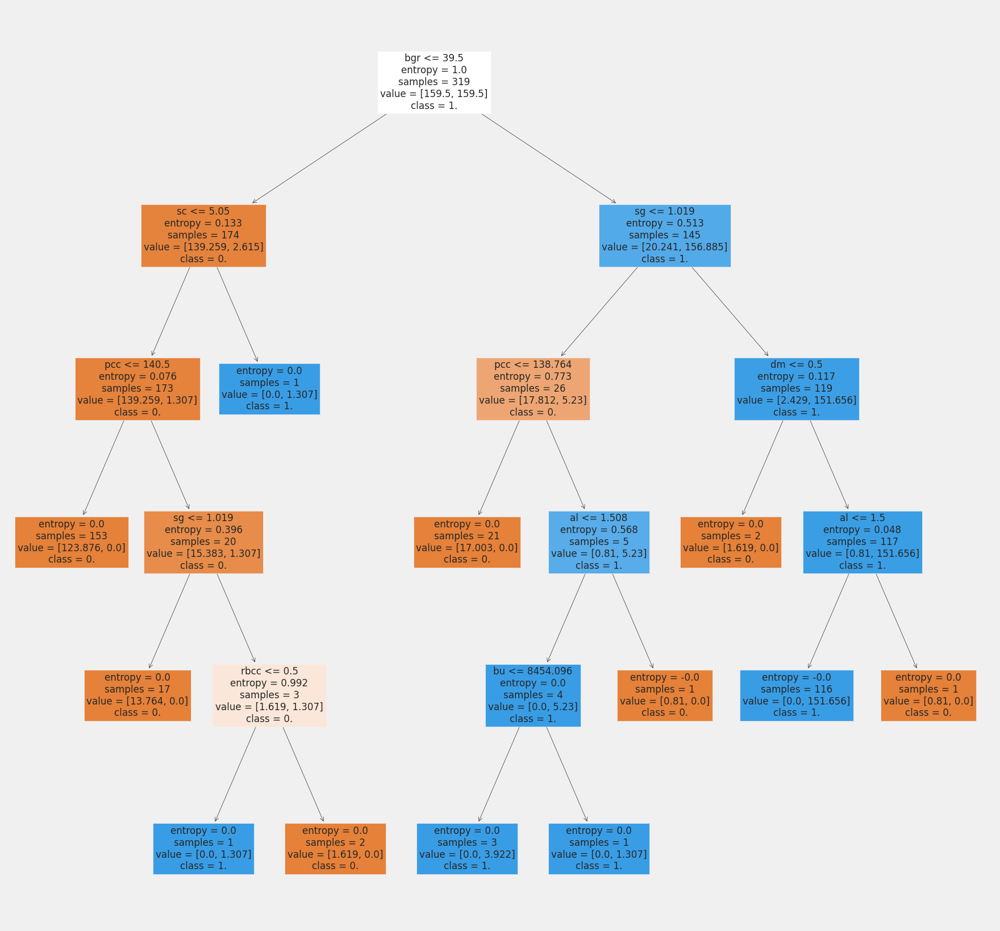

In [246]:
plt.figure(figsize=(20,20))
features = df.columns
classes = ["0.","1."]
tree.plot_tree(clf,feature_names=features,class_names=classes,filled=True)
plt.show()

In [247]:
path = clf.cost_complexity_pruning_path(x_train, y_train)
print(path)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
print(ccp_alphas)

{'ccp_alphas': array([0.00000000e+00, 5.25151886e-18, 9.09918965e-03, 1.07622722e-02,
       1.16341989e-02, 1.28092193e-02, 2.28320679e-02, 2.54008799e-02,
       3.36541251e-02, 4.50485701e-02, 1.72369748e-01, 6.56389729e-01]), 'impurities': array([-8.60369397e-17, -8.07854208e-17,  9.09918965e-03,  1.98614618e-02,
        3.14956607e-02,  4.43048800e-02,  6.71369479e-02,  9.25378278e-02,
        1.26191953e-01,  1.71240523e-01,  3.43610271e-01,  1.00000000e+00])}
[0.00000000e+00 5.25151886e-18 9.09918965e-03 1.07622722e-02
 1.16341989e-02 1.28092193e-02 2.28320679e-02 2.54008799e-02
 3.36541251e-02 4.50485701e-02 1.72369748e-01 6.56389729e-01]


Train score 1.0
Test score 0.8390645410391885
Train Confusion matrix


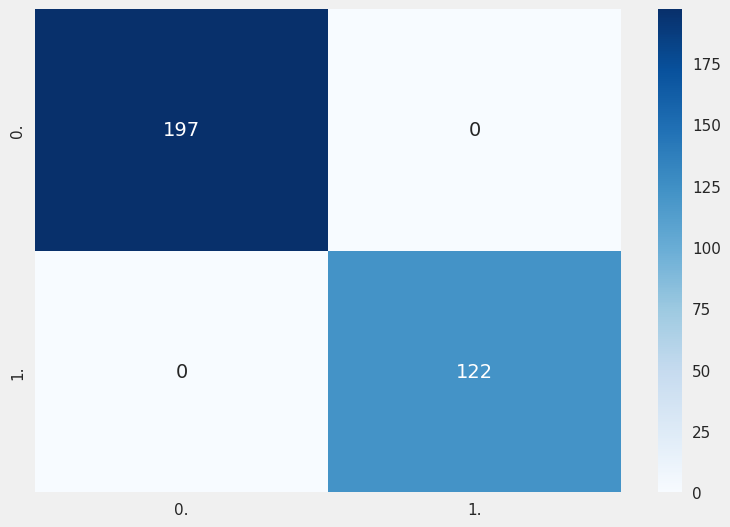

Test Confusion matrix


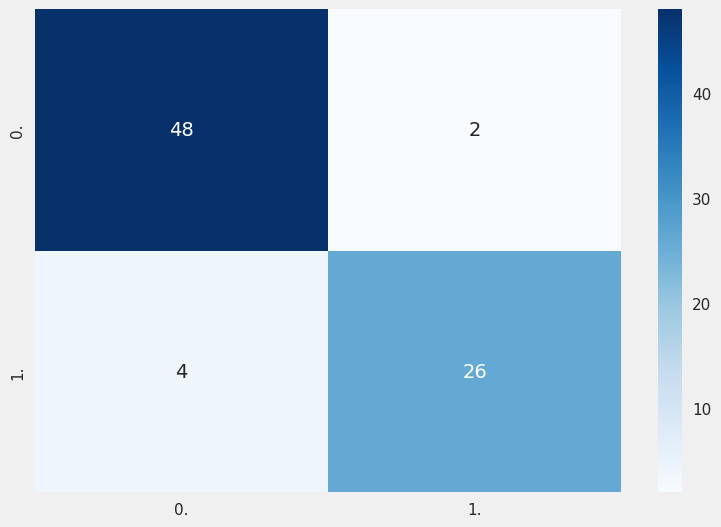

In [248]:
from sklearn.metrics import f1_score, matthews_corrcoef
print(f'Train score {matthews_corrcoef(y_train_pred,y_train)}')
print(f'Test score {matthews_corrcoef(y_test_pred,y_test)}')
plot_confusionmatrix(y_train_pred,y_train,dom='Train')
plot_confusionmatrix(y_test_pred,y_test,dom='Test')

In [250]:
# For each alpha we will append our model to a list
clfs = []
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeClassifier(criterion="entropy",random_state=42, ccp_alpha=ccp_alpha, class_weight="balanced")
    clf.fit(x_train, y_train)
    clfs.append(clf)

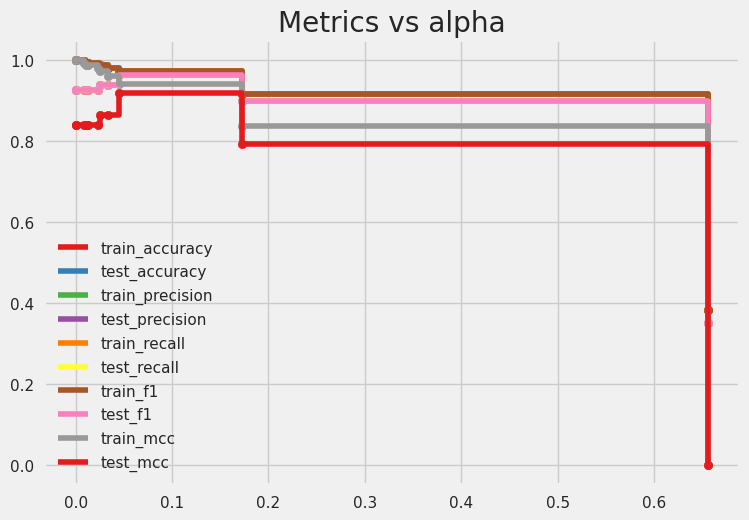

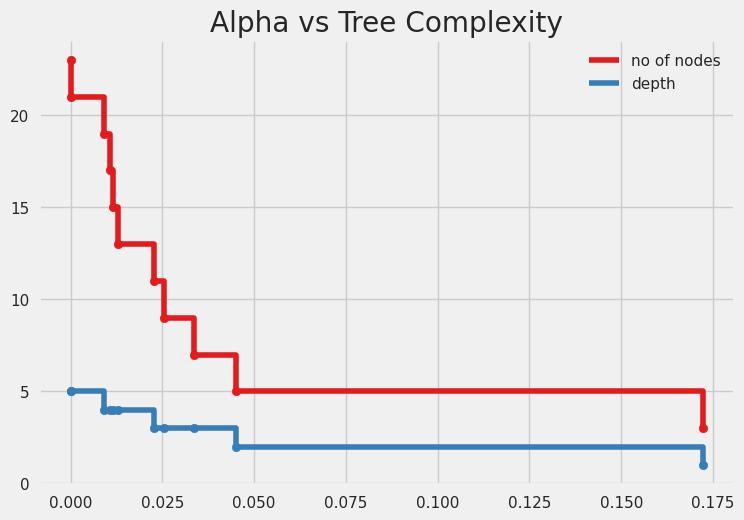

In [251]:
clf_ = clfs

train_acc = []
test_acc = []

train_precision = []
test_precision = []

train_recall = []
test_recall = []

train_f1 = []
test_f1 = []

train_mcc = []
test_mcc = []


for c in clfs:
    y_train_pred = c.predict(x_train)
    y_test_pred = c.predict(x_test)

    train_acc.append(accuracy_score(y_train_pred,y_train))
    test_acc.append(accuracy_score(y_test_pred,y_test))

    train_precision.append(precision_score(y_train_pred,y_train, average="micro"))
    test_precision.append(precision_score(y_test_pred,y_test, average="micro"))

    train_recall.append(recall_score(y_train_pred,y_train, average="micro"))
    test_recall.append(recall_score(y_test_pred,y_test, average="micro"))

    train_f1.append(f1_score(y_train_pred,y_train, average="micro"))
    test_f1.append(f1_score(y_test_pred,y_test, average="micro"))

    train_mcc.append(matthews_corrcoef(y_train_pred,y_train))
    test_mcc.append(matthews_corrcoef(y_test_pred,y_test))

plt.scatter(ccp_alphas,train_acc)
plt.scatter(ccp_alphas,test_acc)

plt.scatter(ccp_alphas,train_precision)
plt.scatter(ccp_alphas,test_precision)

plt.scatter(ccp_alphas,train_recall)
plt.scatter(ccp_alphas,test_recall)

plt.scatter(ccp_alphas,train_f1)
plt.scatter(ccp_alphas,test_f1)

plt.scatter(ccp_alphas,train_mcc)
plt.scatter(ccp_alphas,test_mcc)

plt.plot(ccp_alphas,train_acc,label='train_accuracy',drawstyle="steps-post")
plt.plot(ccp_alphas,test_acc,label='test_accuracy',drawstyle="steps-post")

plt.plot(ccp_alphas,train_precision,label='train_precision',drawstyle="steps-post")
plt.plot(ccp_alphas,test_precision,label='test_precision',drawstyle="steps-post")

plt.plot(ccp_alphas,train_recall,label='train_recall',drawstyle="steps-post")
plt.plot(ccp_alphas,test_recall,label='test_recall',drawstyle="steps-post")

plt.plot(ccp_alphas,train_f1,label='train_f1',drawstyle="steps-post")
plt.plot(ccp_alphas,test_f1,label='test_f1',drawstyle="steps-post")

plt.plot(ccp_alphas,train_mcc,label='train_mcc',drawstyle="steps-post")
plt.plot(ccp_alphas,test_mcc,label='test_mcc',drawstyle="steps-post")

plt.legend()
plt.title('Metrics vs alpha')
plt.show()

clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]
node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]

plt.scatter(ccp_alphas,node_counts)
plt.scatter(ccp_alphas,depth)
#plt.scatter(ccp_alphas,ccp_alphas)

plt.plot(ccp_alphas,node_counts,label='no of nodes',drawstyle="steps-post")
plt.plot(ccp_alphas,depth,label='depth',drawstyle="steps-post")
#plt.plot(ccp_alphas,ccp_alphas,label='ccp_alphas',drawstyle="steps-post")

plt.title('Alpha vs Tree Complexity')

plt.legend()
plt.show()

CHOOSING A GOOD CCP(COST COMPLEXITY PRUNING) ALPHA WHICH 0.1 WITH LESS THAN 5 TREE NODES AND DEPTH AND HAVE GREATER THAN 90% METRICS

Train accuracy 0.987460815047022
Test accuracy 0.9375
Train precision 0.987460815047022
Test precision 0.9375
Train recall 0.987460815047022
Test recall 0.9375
Train f1 0.987460815047022
Test f1 0.9375
Train mcc 0.9734542731130897
Test mcc 0.8640810465184877
Train Confusion matrix


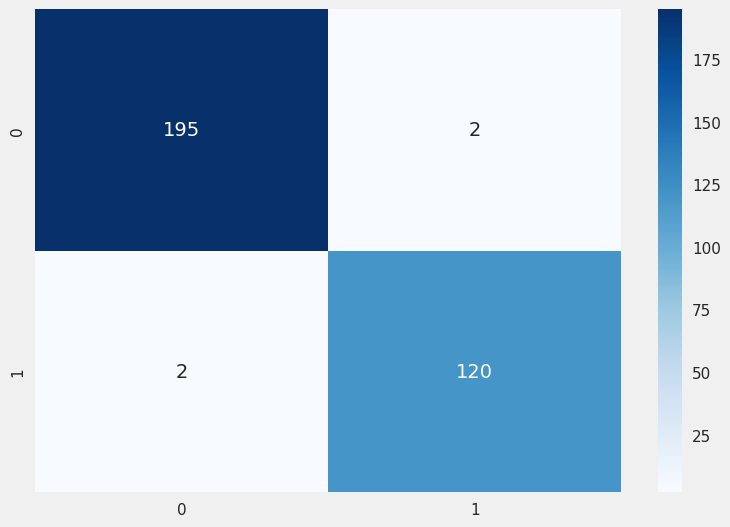

Test Confusion matrix


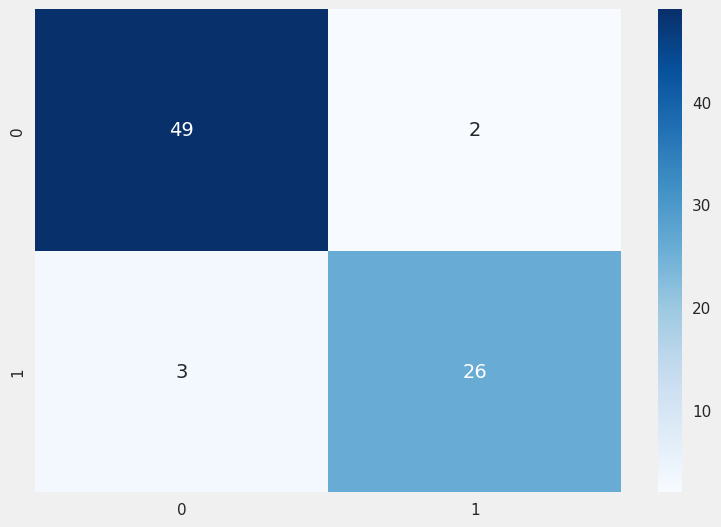

In [272]:
from sklearn.metrics import matthews_corrcoef
clf_ = tree.DecisionTreeClassifier(criterion="entropy",random_state=0,ccp_alpha=0.03, class_weight="balanced")
clf_.fit(x_train,y_train)
y_train_pred = clf_.predict(x_train)
y_test_pred = clf_.predict(x_test)

print(f'Train accuracy {accuracy_score(y_train_pred,y_train)}')
print(f'Test accuracy {accuracy_score(y_test_pred,y_test)}')

print(f'Train precision {precision_score(y_train_pred,y_train,average="micro")}')
print(f'Test precision {precision_score(y_test_pred,y_test,average="micro")}')

print(f'Train recall {recall_score(y_train_pred,y_train,average="micro")}')
print(f'Test recall {recall_score(y_test_pred,y_test,average="micro")}')

print(f'Train f1 {f1_score(y_train_pred,y_train,average="micro")}')
print(f'Test f1 {f1_score(y_test_pred,y_test,average="micro")}')

print(f'Train mcc {matthews_corrcoef(y_train_pred,y_train)}')
print(f'Test mcc {matthews_corrcoef(y_test_pred,y_test)}')


plot_confusionmatrix(y_train_pred,y_train,dom='Train')
plot_confusionmatrix(y_test_pred,y_test,dom='Test')

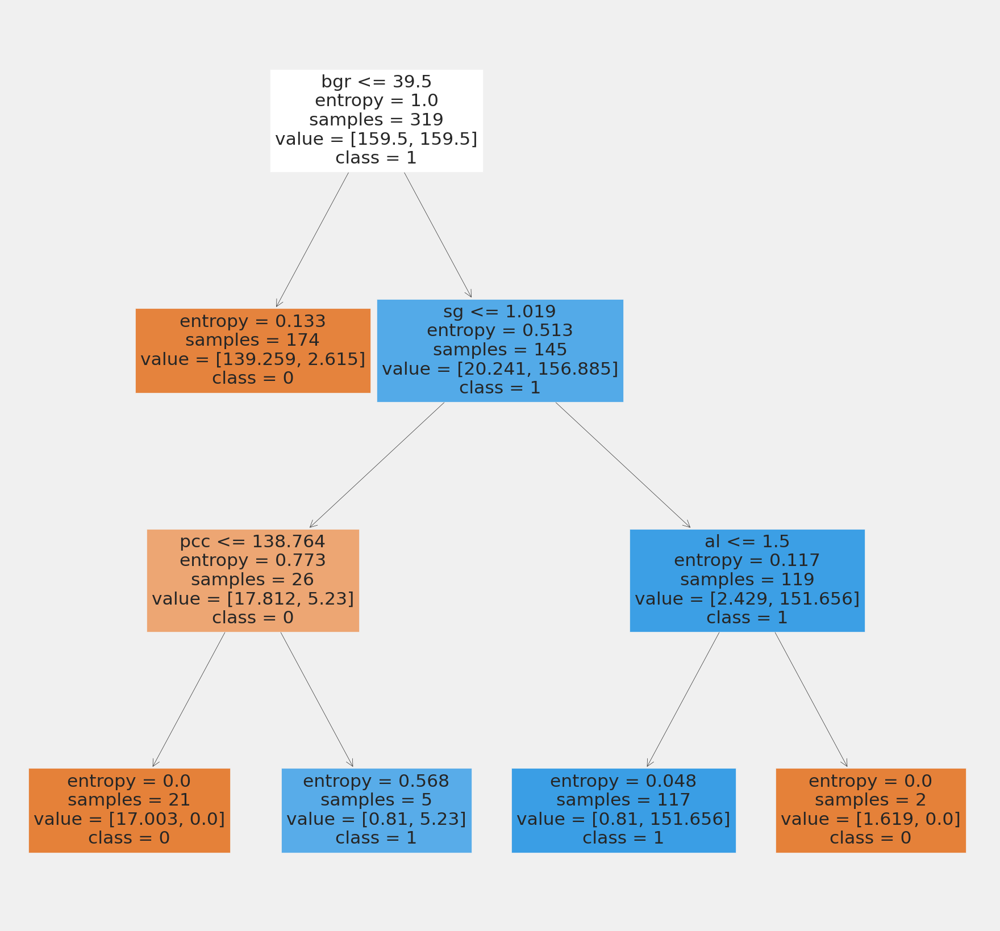

In [273]:
plt.figure(figsize=(20,20))
features = df.columns
classes = ['0','1']
tree.plot_tree(clf_,feature_names=features,class_names=classes,filled=True)
plt.show()

#CROSS VALIDATION SCORE OF MODEL

In [274]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
cross_val_score(clf_, X, y, cv=10)


array([1.        , 0.975     , 1.        , 0.975     , 0.9       ,
       0.975     , 0.95      , 0.975     , 1.        , 0.97435897])